In [2]:
#% matplotlib inline
import skimage
print(skimage.__version__)
import numpy as np
from PIL import Image, ImageFont, ImageDraw
from PIL.ImageChops import add, subtract, multiply, difference, screen
import PIL.ImageStat as stat
from skimage.io import imread, imsave, imshow, show, imread_collection, imshow_collection
from skimage import color, exposure, img_as_float, data
from skimage.transform import SimilarityTransform, warp, swirl
from skimage.util import invert, random_noise, montage
import matplotlib.image as mpimg
import matplotlib.pylab as plt
from scipy.ndimage import affine_transform, zoom
from scipy import misc

0.25.2


C:\Users\MKOTAN\AppData\Local\Temp\ipykernel_21500\2618437196.py:15: DeprecationWarning: scipy.misc is deprecated and will be removed in 2.0.0
  from scipy import misc


In [3]:
#PIL kullanarak okuma, kaydetme, görüntüleme
#RGB renk değeri KIRMIZI, YEŞİL ve MAVİ ışık kaynaklarını temsil eder. 
#RGBA renk değeri, RGB'nin bir Alfa kanalı (opaklık) ile uzantısıdır.

im = Image.open("Ims/DALL·E15.png") # görüntüyü okuma
print(im.width, im.height, im.mode, im.format, type(im)) # görüntü özellikleri
im.show() # görüntüle

469 459 RGBA PNG <class 'PIL.PngImagePlugin.PngImageFile'>


In [4]:
#Renkli RGB görüntüsünü gri tonlamalı bir görüntüye dönüştürmek için PIL fonksiyonu olan convert()'in kullanımı:
# P modunu da deneyiniz. Farkı araştırınız.
im_g = im.convert('L') # RGB görüntüyü gri seviyeye dönüştür.
im_g.save('Ims/fish_gray.png') # Görüntüyü kaydet
Image.open("Ims/fish_gray.png").show() # Gri seviye görüntüyü oku ve görüntüle

(875, 1255, 4) float32 <class 'numpy.ndarray'>


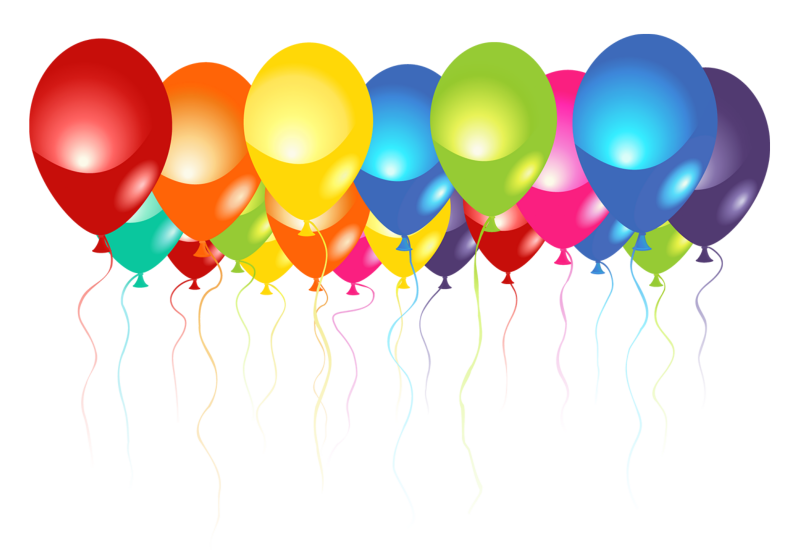

In [5]:
#Matplotlib kullanarak okuma, kaydetme ve görüntüleme

im = mpimg.imread("Ims/alfaim.png") # görüntüyü disk üzerinden numpy ndarray olarak okuma
print(im.shape, im.dtype, type(im)) # Görüntüde fazladan bir α kanalı olduğuna dikkat edin, kanal_sayısı= 4
plt.figure(figsize=(10,10))
plt.imshow(im)
plt.axis('off')
plt.show()

In [6]:
#Piksel değerleri 0 ile 1 arasında floating point olarak temsil edilir
print(im)
print(im[:,1])
print(im[100,100])

[[[1. 1. 1. 0.]
  [1. 1. 1. 0.]
  [1. 1. 1. 0.]
  ...
  [1. 1. 1. 0.]
  [1. 1. 1. 0.]
  [1. 1. 1. 0.]]

 [[1. 1. 1. 0.]
  [1. 1. 1. 0.]
  [1. 1. 1. 0.]
  ...
  [1. 1. 1. 0.]
  [1. 1. 1. 0.]
  [1. 1. 1. 0.]]

 [[1. 1. 1. 0.]
  [1. 1. 1. 0.]
  [1. 1. 1. 0.]
  ...
  [1. 1. 1. 0.]
  [1. 1. 1. 0.]
  [1. 1. 1. 0.]]

 ...

 [[1. 1. 1. 0.]
  [1. 1. 1. 0.]
  [1. 1. 1. 0.]
  ...
  [1. 1. 1. 0.]
  [1. 1. 1. 0.]
  [1. 1. 1. 0.]]

 [[1. 1. 1. 0.]
  [1. 1. 1. 0.]
  [1. 1. 1. 0.]
  ...
  [1. 1. 1. 0.]
  [1. 1. 1. 0.]
  [1. 1. 1. 0.]]

 [[1. 1. 1. 0.]
  [1. 1. 1. 0.]
  [1. 1. 1. 0.]
  ...
  [1. 1. 1. 0.]
  [1. 1. 1. 0.]
  [1. 1. 1. 0.]]]
[[1. 1. 1. 0.]
 [1. 1. 1. 0.]
 [1. 1. 1. 0.]
 ...
 [1. 1. 1. 0.]
 [1. 1. 1. 0.]
 [1. 1. 1. 0.]]
[0.80784315 0.07843138 0.0627451  1.        ]


(459, 469, 4) float32 <class 'numpy.ndarray'>


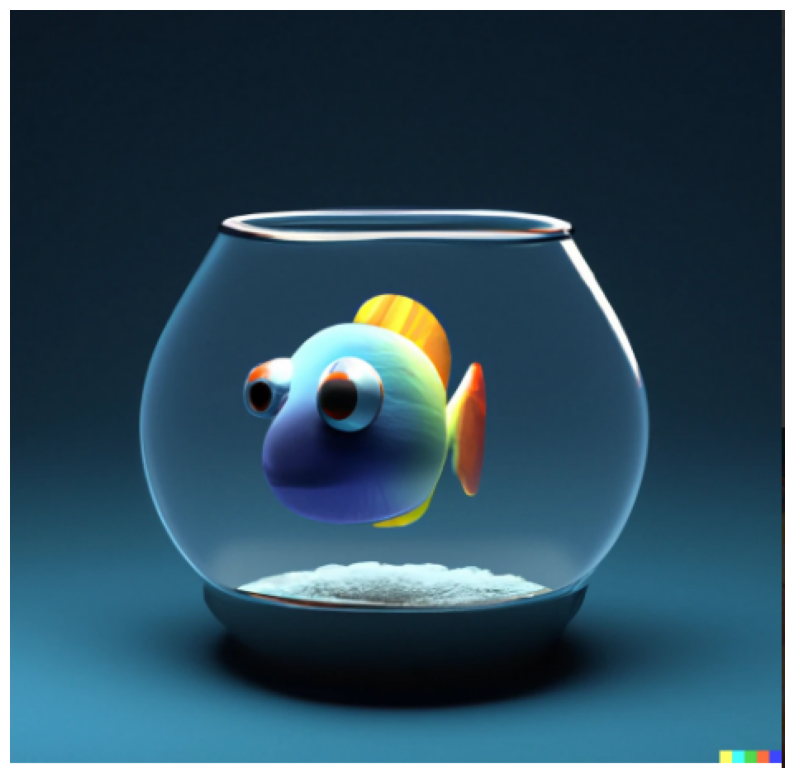

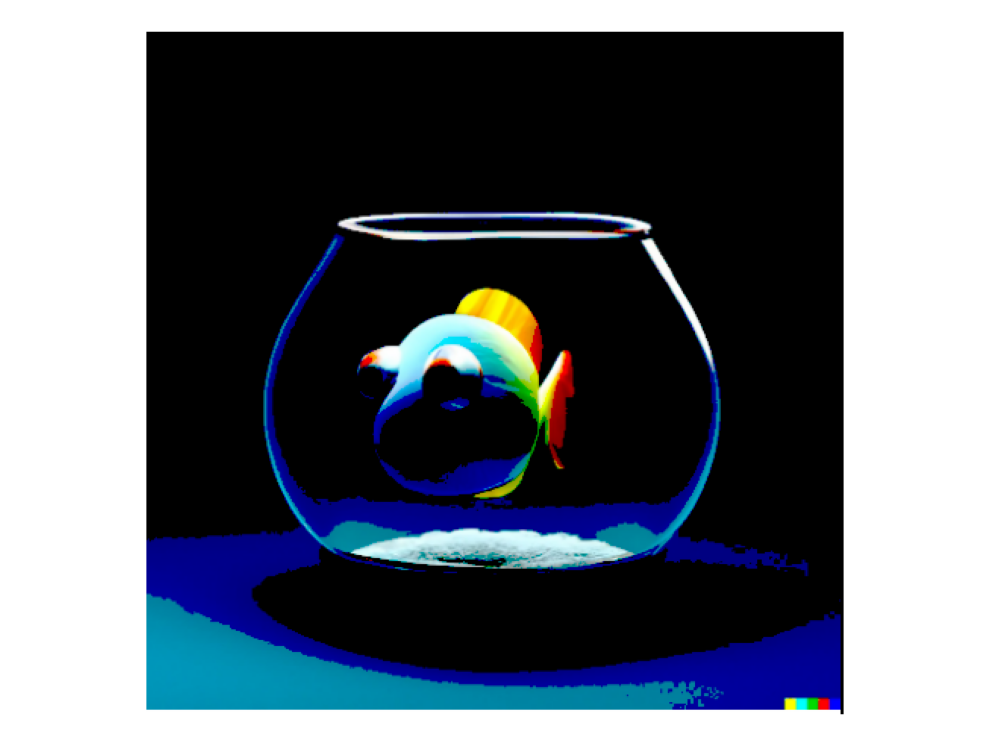

In [7]:
im = mpimg.imread("Ims/DALL·E15.png") # görüntüyü disk üzerinden numpy ndarray olarak okuma
print(im.shape, im.dtype, type(im)) 
plt.figure(figsize=(10,10))
plt.imshow(im)
plt.axis('off')
plt.show()

im1 = im
im1[im1 < 0.5] = 0 # görüntüyü daha koyulaştır. 0.5 değeri altındaki pikseller 0 olarak ayarlanır.
plt.imshow(im1)
plt.axis('off')
plt.tight_layout()
plt.savefig("Ims/DALL·E15_dark.png") # kaydet
plt.close()
im = mpimg.imread("Ims/DALL·E15_dark.png") # oku
plt.figure(figsize=(10,10))
plt.imshow(im)
plt.axis('off') # eksen tiklerini kaldır
plt.tight_layout()
plt.show()

#### Matplotlib imshow() ile görüntülerken enterpolasyon yapma

(22, 22, 3)


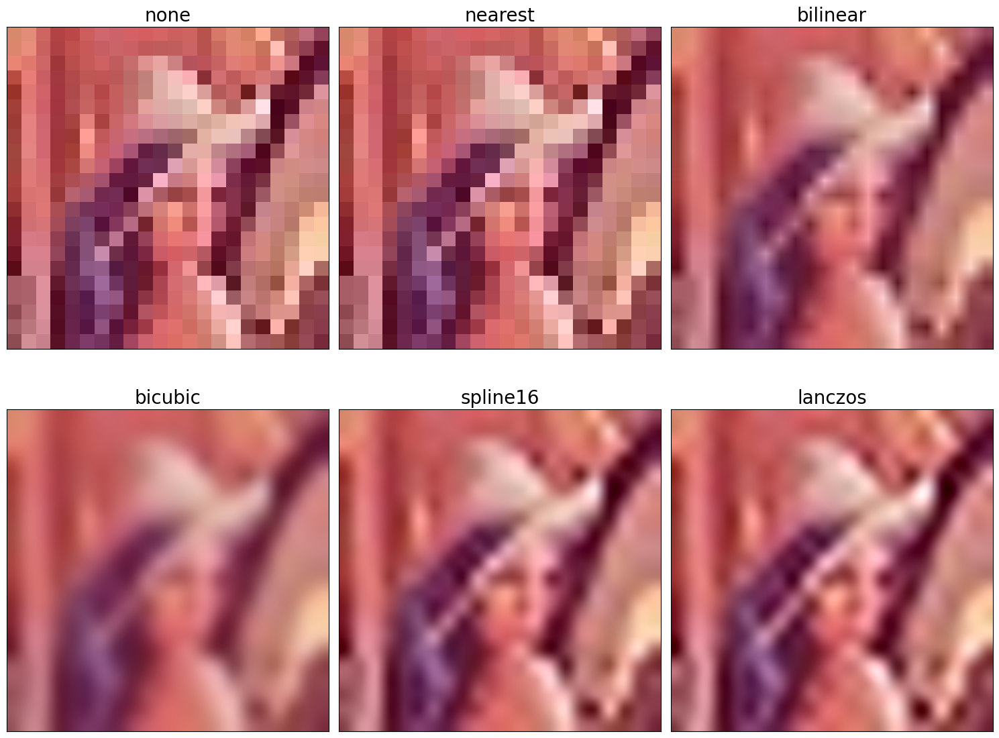

In [8]:
# Matplotlib'in imshow() fonksiyonu, bir görüntüyü çizmek için birçok farklı türde enterpolasyon yöntemi sağlar. 
# Bu fonksiyonlar özellikle çizilecek görüntü küçük olduğunda faydalı olabilir. 
# 50 x 50 lena görüntüsünü kullanalım:

im = mpimg.imread("Ims/lena_small.jpg") #  numpy ndarray
print(im.shape)
methods = ['none', 'nearest', 'bilinear', 'bicubic', 'spline16', 'lanczos']
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15, 12), subplot_kw={'xticks': [], 'yticks': []})
fig.subplots_adjust(hspace=0.05, wspace=0.05)
for ax, interp_method in zip(axes.flat, methods):
    ax.imshow(im, interpolation=interp_method)
    ax.set_title(str(interp_method), size=20)
plt.tight_layout()
plt.show()




#### scikit-image kullanarak okuma, kaydetme ve görüntüleme


C:\Users\MKOTAN\AppData\Local\Temp\ipykernel_21500\2605235073.py:16: FutureWarning: `imshow` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  plt.axis('off'), imshow(im), show()
C:\Users\MKOTAN\AppData\Local\Temp\ipykernel_21500\2605235073.py:16: FutureWarning: `show` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  plt.axis('off'), imshow(im), show()


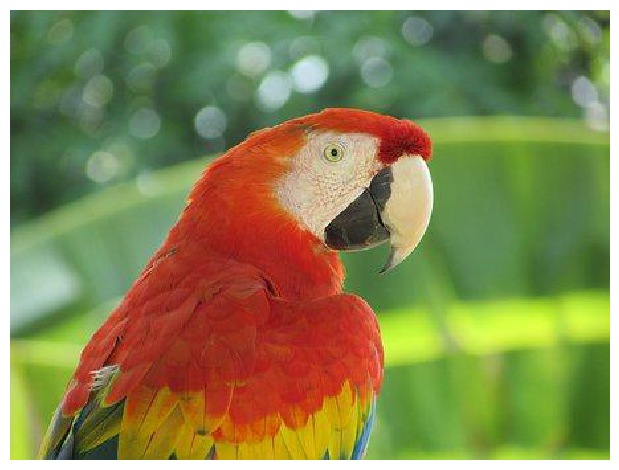

(340, 453, 3) uint8 <class 'numpy.ndarray'>


C:\Users\MKOTAN\AppData\Local\Temp\ipykernel_21500\2605235073.py:24: FutureWarning: `imshow` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  plt.axis('off'), imshow(im), show()
C:\Users\MKOTAN\AppData\Local\Temp\ipykernel_21500\2605235073.py:24: FutureWarning: `show` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  plt.axis('off'), imshow(im), show()


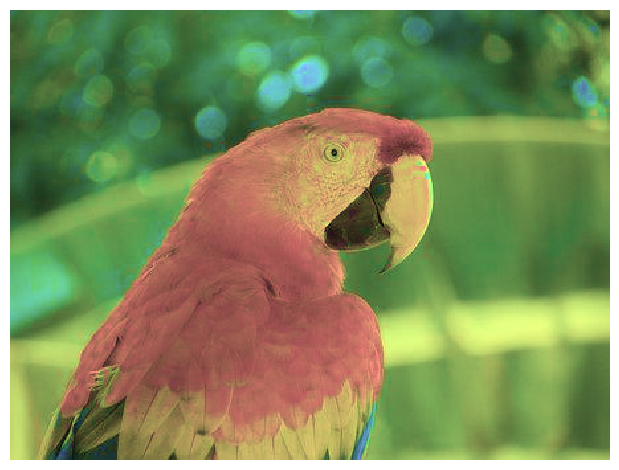

((np.float64(0.0), np.float64(1.0), np.float64(0.0), np.float64(1.0)),
 None)

In [11]:
#Bir sonraki kod bloğu, uint8 (8-bit işaretsiz tamsayı) tipinde bir numpy ndarray olarak bir görüntüyü okumak için 
# scikit-image'in imread() fonksiyonunu kullanır.Dolayısıyla, piksel değerleri 0 ile 255 arasında olacaktır. 
# Ardından, Image.color modülündeki hsv2rgb() işlevini kullanarak renkli RGB görüntüsünü HSV görüntüsüne dönüştürür 
# (Hue) ve (Value) kanallarını değiştirmeden tutarak doygunluğu (Saturation) tüm pikseller için sabit bir değere değiştirir.
# Görüntü daha sonra rgb2hsv() işleviyle tekrar RGB moduna dönüştürülerek yeni bir görüntü oluşturulur ve bu görüntü kaydedilip görüntülenir:
# Hue: Rengi temsil eder.Saturation: Doygunluk, renk alanındaki gri aralığını gösterir. 
# Soluk bir renk, daha düşük bir doygunluk seviyesinden kaynaklanır, bu da rengin daha fazla gri içerdiği anlamına gelir.
# Value: rengin parlaklığıdır ve renk doygunluğuna göre değişir. '0' olduğunda renk uzayı tamamen siyah olacaktır. 
# Değer arttıkça renk uzayı parlaklaşır ve çeşitli renkler gösterir. 
# Farklı Renk uzayı modellerini araştırınız : (RGB, HSV,CMYK,YIQ ..)

from skimage import img_as_ubyte
from skimage import io, color

im = imread("Ims/parrot.png") 
plt.axis('off'), imshow(im), show()
print(im.shape, im.dtype, type(im))
hsv = color.rgb2hsv(im) # RGB to HSV renk uzayı
hsv[:, :, 1] = 0.5 # saturation değiştir
im1 = color.hsv2rgb(hsv) # HSV den RGB ye dönüş
im1 = img_as_ubyte(im1)
imsave('Ims/parrot_hsv.png', im1) 
im = imread("Ims/parrot_hsv.png")
plt.axis('off'), imshow(im), show()

C:\Users\MKOTAN\AppData\Local\Temp\ipykernel_21500\2096373080.py:4: FutureWarning: `imshow` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  imshow(im), show()
C:\Users\MKOTAN\AppData\Local\Temp\ipykernel_21500\2096373080.py:4: FutureWarning: `show` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  imshow(im), show()


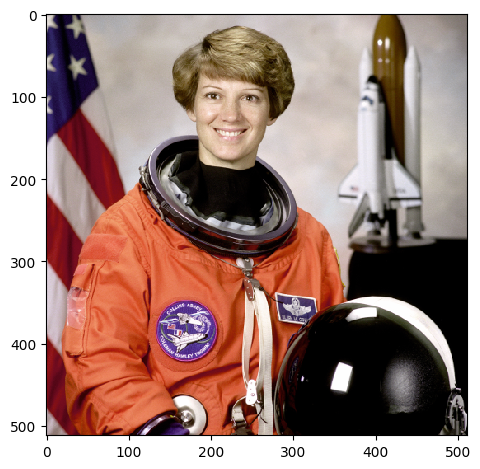

(<matplotlib.image.AxesImage at 0x29e9b9e2ba0>, None)

In [12]:
#scikitimage kütüphanesinin görüntü veri kümelerinden veri modülü ile yükleme:

im = data.astronaut()
imshow(im), show()

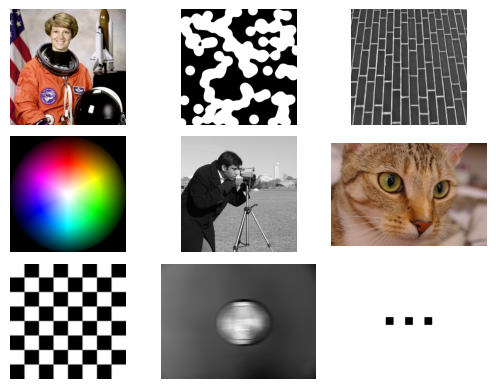

In [13]:
fig, axs = plt.subplots(nrows=3, ncols=3)
for ax in axs.flat:
    ax.axis("off")
axs[0, 0].imshow(data.astronaut())
axs[0, 1].imshow(data.binary_blobs(), cmap=plt.cm.gray)
axs[0, 2].imshow(data.brick(), cmap=plt.cm.gray)
axs[1, 0].imshow(data.colorwheel())
axs[1, 1].imshow(data.camera(), cmap=plt.cm.gray)
axs[1, 2].imshow(data.cat())
axs[2, 0].imshow(data.checkerboard(), cmap=plt.cm.gray)
axs[2, 1].imshow(data.clock(), cmap=plt.cm.gray)
further_img = np.full((300, 300), 255)
for xpos in [100, 150, 200]:
    further_img[150 - 10 : 150 + 10, xpos - 10 : xpos + 10] = 0
axs[2, 2].imshow(further_img, cmap=plt.cm.gray)
plt.subplots_adjust(wspace=0.1, hspace=0.1)

#### Farklı görüntü türleri ve dosya formatları ile çalışma ve temel görüntü manipülasyonlarını gerçekleştirme

In [14]:
#Dosya formatları

# Görüntü dosyaları farklı formatlarda olabilir. Popüler olanlardan bazıları BMP (8-bit, 24-bit, 32-bit), PNG, JPG (JPEG), GIF, 
# PPM, PNM ve TIFF'dir. 
# Bir görüntü dosyasından veri çıkarmak için o dosyanın belirli formatı (ve meta verilerin nasıl saklandığı) hakkında 
# Python görüntü işleme kütüphaneleri görüntüyü okuyacak ve bilgilerle birlikte verileri çıkaracaktır 
# (örneğin, görüntü boyutu, türü / modu ve veri türü).
# https://koksalakgun.com/resim-dosyasi-uzantilari-ozellikleri-nelerdir/
#Bir dosya formatından diğerine dönüştürme

im = Image.open("Ims/parrot.png")
print(im.mode)
im.save("Ims/parrot.jpg")



RGB


In [15]:
#Ancak PNG dosyası RGBA modundaysa, JPG olarak kaydetmeden önce RGB moduna dönüştürülmelidir.
im = Image.open("Ims/hill.png")
print(im.mode)
# RGBA
im.convert('RGB').save("Ims/hill.jpg") # 

RGBA


In [16]:
# Görüntü türleri (modlar):
# Bir görüntü aşağıdaki farklı türlerde olabilir:
#  1-Tek kanallı görüntüler - her piksel tek bir değerle temsil edilir:
#     I -İkili (monokrom) görüntüler (her piksel tek bir 0-1 bit ile temsil edilir)
#     II-Gri seviyeli görüntüler (her piksel 8 bit ile temsil edilebilir ve tipik olarak 0-255 aralığında değerlere sahip olabilir)
#  2-Çok kanallı görüntüler - her piksel bir değer çiftiyle temsil edilir:
#     I- Üç Kanallı görüntüler: Örneğin;
#         a- RGB görüntüler: Her piksel, her piksel için kırmızı, yeşil ve mavi kanal renk değerlerini temsil eden üç tuple (r, g, b) değeriyle temsil edilir. 
#         b- HSV görüntüler: Her piksel, her piksel için renk tonu (hue) (renk), saturation (renklilik - rengin beyazla ne kadar karıştırıldığı) ve value (parlaklık - rengin siyahla ne kadar karıştırıldığı) kanal renk değerlerini temsil eden üç çift (h, s, v) değerle temsil edilir. HSV modeli renkleri, insan gözünün renkleri algılama eğilimine benzer bir şekilde tanımlar.
#     II- Dört kanallı görüntüler; örneğin, 
#         a- RGBA görüntüler: her piksel, son kanal şeffaflığı temsil eden üç ikili (r, g, b, α) değerlerle temsil edilir.


In [17]:
# Bir görüntü modundan diğerine dönüştürme
# Bir RGB görüntüsünü, görüntünün kendisini okurken gri tonlamalı bir görüntüye dönüştürebiliriz. 
im1 = imread("Ims/parrot.png")
print(im1.shape)
im2 = imread("Ims/parrot.png", as_gray=True)
print(im2.shape)

(340, 453, 3)
(340, 453)


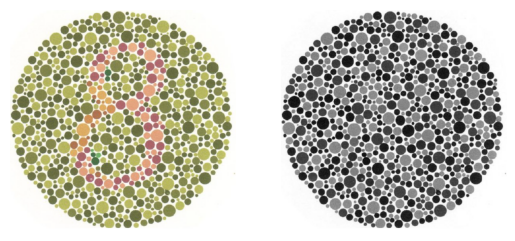

In [18]:
# Bazı renkli görüntüler için gri tonlamaya dönüştürürken bazı bilgileri kaybedebileceğimizi unutmayınız. 
# Aşağıdaki kod, renk körlüğünü tespit etmek için kullanılan Ishihara plakaları ile böyle bir örneği göstermektedir. 
im = imread("Ims/Ishihara.png")
im_g = color.rgb2gray(im)
plt.subplot(121), plt.imshow(im, cmap='gray'), plt.axis('off')
plt.subplot(122), plt.imshow(im_g, cmap='gray'), plt.axis('off')
plt.show()

<Figure size 640x480 with 0 Axes>

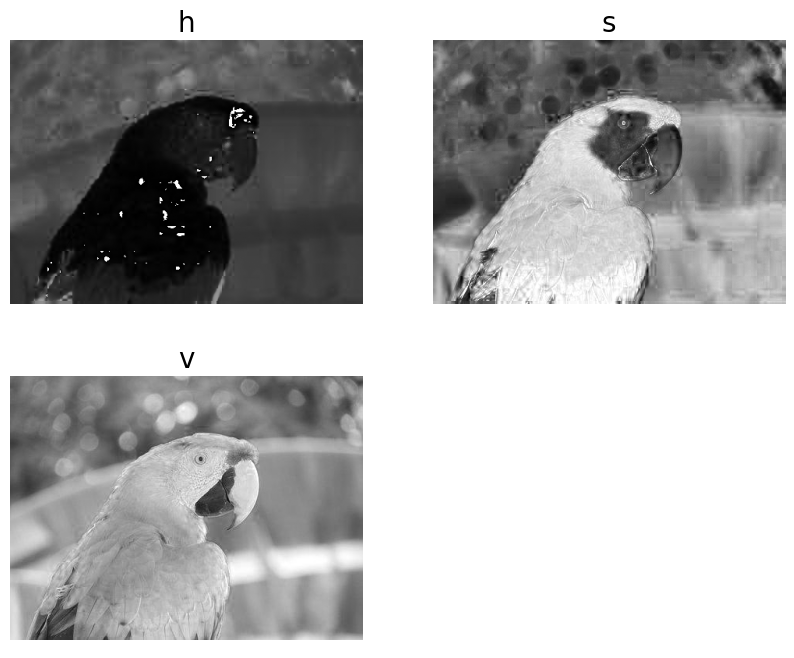

In [19]:
#Bazı renk uzayları (kanallar)
# Bazı bilindik kanal/renk uzayları: RGB, HSV, XYZ, YUV, YIQ, YPbPr, YCbCr ve YDbDr. 
# Bir renk uzayından diğerine geçmek için Affine eşlemeleri kullanılabilir.

# Aynı şekilde kütüphane fonksiyonlarını kullanarak bir renk uzayından diğerine dönüştürebiliriz:

im = imread("Ims/parrot.png")
im_hsv = color.rgb2hsv(im)
plt.gray()
plt.figure(figsize=(10,8))
plt.subplot(221), plt.imshow(im_hsv[...,0]), plt.title('h', size=20),
plt.axis('off')
plt.subplot(222), plt.imshow(im_hsv[...,1]), plt.title('s', size=20),
plt.axis('off')
plt.subplot(223), plt.imshow(im_hsv[...,2]), plt.title('v', size=20),
plt.axis('off')
plt.subplot(224), plt.axis('off')
plt.show()

<Figure size 640x480 with 0 Axes>

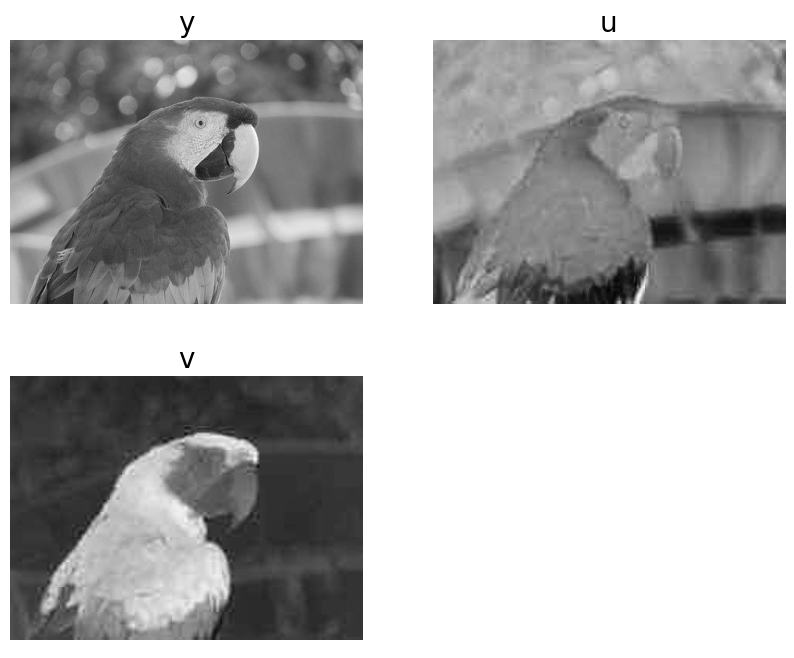

In [20]:
# Benzer şekilde, rgb2yuv() fonksiyonunu kullanarak görüntüyü YUV renk uzayına dönüştürebiliriz.
im = imread("Ims/parrot.png")
im_hsv = color.rgb2yuv(im)
plt.gray()
plt.figure(figsize=(10,8))
plt.subplot(221), plt.imshow(im_hsv[...,0]), plt.title('y', size=20),
plt.axis('off')
plt.subplot(222), plt.imshow(im_hsv[...,1]), plt.title('u', size=20),
plt.axis('off')
plt.subplot(223), plt.imshow(im_hsv[...,2]), plt.title('v', size=20),
plt.axis('off')
plt.subplot(224), plt.axis('off')
plt.show()

C:\Users\MKOTAN\AppData\Local\Temp\ipykernel_21500\1278397856.py:6: FutureWarning: `imshow` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  imshow(im) # skimage kullanarak görüntüle
C:\Users\MKOTAN\AppData\Local\Temp\ipykernel_21500\1278397856.py:7: FutureWarning: `show` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  plt.axis('off'), show()


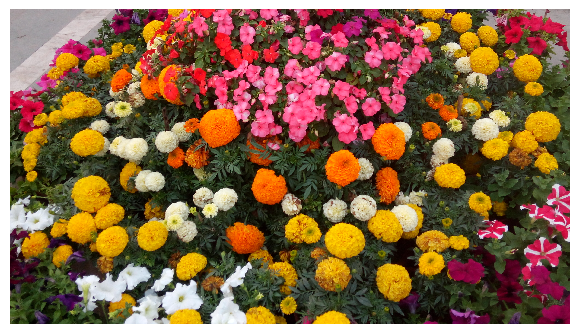

In [21]:
#Görüntü veri yapılarını dönüştürme
# PIL Image nesnesinden numpy ndarray'e (scikit-image kullanacak şekilde) dönüştürme:

im = Image.open('Ims/flowers.png') # PIL ile görüntüyü oku
im = np.array(im) # numpy ndarray oluştur
imshow(im) # skimage kullanarak görüntüle
plt.axis('off'), show()

im = imread('Ims/flowers.png') # skimage ile görüntüyü numpy ndarray olarak oku
im = Image.fromarray(im) #  PIL Image nesnesi oluştur
im.show() # PIL Image.show() methodu ile görüntüle

## Temel görüntü manipülasyonları

In [22]:
#Temel görüntü manipülasyonu için farklı Python kütüphaneleri kullanılabilir. 
#Kütüphanelerin çoğu bir görüntüyü numpy ndarray'de saklar (örneğin gri tonlama için 2 boyutlu bir dizi ve RGB görüntüsü için 3 boyutlu bir dizi). 
# Orijin, görüntü 2-D dizisinin sol üst köşesidir.

In [23]:
#Numpy dizi dilimleme ile görüntü manipülasyonları:

lena = mpimg.imread("Ims/lena.jpg") # read the image from disk as a numpy ndarray
print(lena[0, 40])
# print(lena[10:13, 20:23,0:1]) # slicing
lx, ly, _ = lena.shape
X, Y = np.ogrid[0:lx, 0:ly]
mask = (X - lx / 2) ** 2 + (Y - ly / 2) ** 2 > lx * ly / 4
print(lena.flags)
lena[mask,:] = 0 # masks
plt.figure(figsize=(10,10))
plt.imshow(lena2), plt.axis('off'), plt.show()

[180  76  83]
  C_CONTIGUOUS : True
  F_CONTIGUOUS : False
  OWNDATA : False
  WRITEABLE : False
  ALIGNED : True
  WRITEBACKIFCOPY : False



ValueError: assignment destination is read-only

[180  76  83]
  C_CONTIGUOUS : True
  F_CONTIGUOUS : False
  OWNDATA : True
  WRITEABLE : True
  ALIGNED : True
  WRITEBACKIFCOPY : False



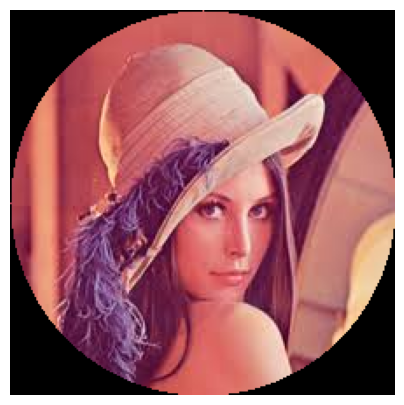

(<matplotlib.image.AxesImage at 0x29e9974b2f0>,
 (np.float64(-0.5), np.float64(219.5), np.float64(219.5), np.float64(-0.5)),
 None)

In [24]:
#Numpy dizi dilimleme ile görüntü manipülasyonları:

lena = np.array(mpimg.imread("Ims/lena.jpg")) # read the image from disk as a numpy ndarray
print(lena[0, 40])
# print(lena[10:13, 20:23,0:1]) # slicing
lx, ly, _ = lena.shape
X, Y = np.ogrid[0:lx, 0:ly]
mask = (X - lx / 2) ** 2 + (Y - ly / 2) ** 2 > lx * ly / 4
print(lena.flags)
lena[mask,:] = 0 # masks
plt.figure(figsize=(5,5))
plt.imshow(lena), plt.axis('off'), plt.show()

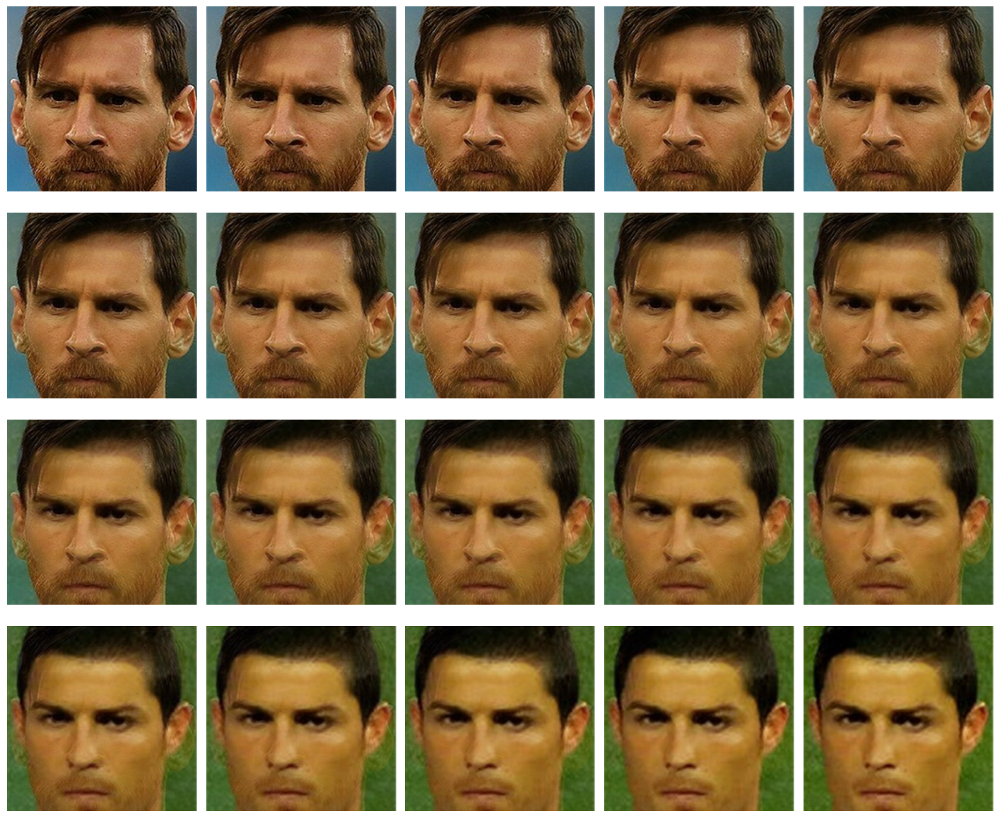

In [25]:
#Basit görüntü dönüştürme (morphing) - cross-dissolving kullanarak iki görüntünün α-blending karıştırılması:
# https://www.oreilly.com/library/view/hands-on-image-processing/9781789343731/065739a2-9bde-49c8-82ac-7583ecbd1321.xhtml 
# https://www.researchgate.net/publication/349573029_Improved_Mesh_Based_Image_Morphing

im1 = mpimg.imread("Ims/messi.jpg") / 255 # RGB değerleri aralığı [0,1] ölçeklenir.
im2 = mpimg.imread("Ims/ronaldo.jpg") / 255
i = 1
plt.figure(figsize=(18,15))
for alpha in np.linspace(0,1,20):
    plt.subplot(4,5,i)
    plt.imshow((1-alpha)*im1 + alpha*im2)
    plt.axis('off')
    i += 1
plt.subplots_adjust(wspace=0.05, hspace=0.05)
plt.show()

# İlerleyen bölümlerde, görüntü biçimlendirme için daha gelişmiş teknikler göreceğiz

In [26]:
# PIL ile görüntü manipülasyonları
# PIL görüntüyü manipüle etmek için birçok fonksiyon sağlar; 

im = Image.open("Ims/parrot.png") # 
print(im.width, im.height, im.mode, im.format) # 
im.show()

453 340 RGB PNG


In [27]:
# Kırpmak - Cropping an image
im_c = im.crop((175,75,320,200)) # (left, top, right, bottom) 
im_c.show()


In [28]:
#Görüntüyü yeniden boyutlandırma
# up-down sampling konularına ileride değineceğiz

im = Image.open("Ims/clock.jpg")
print(im.width, im.height)
im.show()

107 105


In [29]:
im_large = im.resize((im.width*5, im.height*5), Image.BILINEAR) # bi-linear interpolation
print(im_large.width, im_large.height)
im_large.show()

535 525


In [30]:
im = Image.open("Ims/victoria_memorial.png")
print(im.width, im.height)
im.show()

720 540


In [33]:
#im_small = im.resize((im.width//5, im.height//5), Image.ANTIALIAS)
im_small = im.resize((im.width // 5, im.height // 5), Image.Resampling.LANCZOS)
print(im_small.width, im_small.height)
im_small.show()

144 108


In [34]:
# görüntünün negatifini oluşturma
# ilgili dersimizi hatırlayınız.
# point() fonksiyonunu her piksel değerini tek argümanlı bir fonksiyonla dönüştürmek için kullanabiliriz. 
# Bunu görüntüyü negatiflemek için kullanabiliriz. 
# maksimum değerden çıkarılması, ters çevrilmiş görüntüyü elde etmek için her pikselde gereken tam nokta işlemi olacaktır:

im = Image.open("Ims/parrot.png")
#im=im.convert('L') 
im.show()
im_t = im.point(lambda x: 255 - x)
im_t.show()

In [35]:
# grayscale dönüşümü
im_g = im.convert('L') 
im_g.show()

In [36]:
# Bazı gri seviye dönüşümleri:
# Log transformation:
# Log dönüşümü, dinamik piksel değerleri aralığına sahip bir görüntüyü etkili bir şekilde daraltmak için kullanılabilir. 
# Piksel değerleri aralığı daraltılmış, giriş görüntüsündeki daha parlak pikseller daha koyu hale gelmiş ve 
# daha koyu pikseller daha parlak hale gelmiş, böylece piksellerin değer aralığı daralmıştır:
im.show()
im_g.point(lambda x: 255*np.log(1+x/255)).show()


In [37]:
# Bazı gri seviye dönüşümleri:
#Power-law transformation
#https://www.tutorialspoint.com/dip/gray_level_transformations.htm
im.show()
im_g.point(lambda x: 255*(x/255)**0.6).show()

In [38]:
#Bazı geometrik dönüşümler
# Bu dönüşümler bir görüntünün geometrik oryantasyonunu değiştirir, dolayısıyla adı da buradan gelir.


In [39]:
# Görüntünün yansıtılması
im.show()
im.transpose(Image.FLIP_LEFT_RIGHT).show() # dikey eksen yansıtma

In [39]:
# Görüntünün döndürülmesi
im.show()
im_45 = im.rotate(45) # 45 derece döndürme
im_45.show() # 

In [40]:
# Bir görüntüye Afin dönüşümü uygulama
# 2 boyutlu bir Afin dönüşüm matrisi olan T, bir görüntünün her pikseline (homojen koordinatlarda), 
# bir Afin dönüşüme tabi tutulması için uygulanabilir. 

# https://www.youtube.com/watch?v=AheaTd_l5Is&ab_channel=Graphicsin5Minutes

#transform() fonksiyonu orijinal görüntüyü ölçeklemek, çevirmek, döndürmek ve eğiltmek için kullanılabilir:

#Shear
#Aşağıdaki kod, giriş görüntüsü bir shear dönüşümü matrisi ile dönüştürüldüğünde elde edilen çıkış görüntüsünü göstermektedir.
#transform() işlevindeki data argümanı, bir Afin dönüşüm matrisinin ilk iki satırını içeren 6'lı bir çifttir (a, b, c, d, e, f).
#Çıktı görüntüsündeki her piksel (x, y) için yeni değer, girdi görüntüsündeki bir konumdan (a x + b y + c, d x + e y + f) alınır ve en yakın piksele yuvarlanır. 

im = Image.open("Ims/parrot.png")
im.show()
im.transform((int(1.4*im.width), im.height), Image.AFFINE,
data=(1,-0.5,0,0,1,0)).show() # shear

In [41]:
#Perspective transformation

params = [1, 0.2, 0, -0.1, 0.5, 0, -0.005, -0.001]
im1 = im.transform((im.width//3, im.height), Image.PERSPECTIVE, params,
Image.BICUBIC)
im1.show()

In [42]:
# Bir görüntünün piksel değerlerini değiştirme
# Bir görüntüdeki piksel değerini değiştirmek için putpixel() fonksiyonunu kullanabiliriz. 

#Bir görüntüye tuz ve biber gürültüsü (salt and pepper noise) ekleme
#   Tuz ve biber gürültüsü, görüntülerdeki bir dürtü gürültüsü türüdür. 
#   Bu gürültü genellikle veri iletimindeki hatalardan, bellek hücresindeki arızalardan veya analog-dijital dönüştürücü hatalarından kaynaklanır. 
#   Rastgele oluşan beyaz ve siyah pikseller şeklini alır ve bir görüntünün kalitesini önemli ölçüde bozabilir.

# Görüntüden rastgele birkaç piksel seçerek ve ardından bu piksel değerlerinin yaklaşık yarısını siyah 
# ve diğer yarısını beyaz olarak ayarlayarak bir görüntüye biraz tuz ve biber gürültüsü ekleyebiliriz. 

# görüntüden 5000 random konum seç
im1 = im.copy() # orjinal görüntünün kopyasını al
n = 5000
x, y = np.random.randint(0, im.width, n), np.random.randint(0, im.height,n)
for (x,y) in zip(x,y):
    im1.putpixel((x, y), ((0,0,0) if np.random.rand() < 0.5 else (255,255,255))) # salt-and-pepper noise
im1.show()

In [43]:
# Görüntü üzerine çizme
# PIL.ImageDraw modülünden bir görüntü üzerine çizgiler veya diğer geometrik şekiller çizebiliriz

im = Image.open("Ims/parrot.png")
draw = ImageDraw.Draw(im)
draw.ellipse((125, 125, 200, 300), fill=(255,255,255,128))
del draw
im.show()

In [44]:
# Görüntü üzerine metin ekleme
# PIL.ImageDraw modülündeki text() fonksiyonunu kullanarak bir resme metin ekleyebiliriz

im = Image.open("Ims/parrot.png")
draw = ImageDraw.Draw(im)
font = ImageFont.truetype("arial.ttf", 23) # use a truetype font
draw.text((10, 5), "Python ile görüntü işlemeyi sevdiniz mi?", font=font)
del draw
im.show()

In [45]:
#Küçük resim oluşturma (thumbnail)

im = Image.open("Ims/parrot.png")
im_thumbnail = im.copy() # orjinal görüntüyü kopyala
im_thumbnail.thumbnail((100,100)) # thumbnaili üzerine yapıştır.
im.paste(im_thumbnail, (10,10))
im.save("Ims/parrot_thumb.jpg")
im.show()

In [46]:
# Bir görüntünün temel istatistiklerini hesaplama
# Stat modülünü, bir görüntünün temel istatistiklerini (ortalama, medyan, farklı kanalların piksel değerlerinin standart sapması vb.)
# vb. hesaplamak için kullanabiliriz:
s = stat.Stat(im)
print(s.extrema) # her kanal için maximum ve minimum pixel değerleri
print(s.count)
print(s.mean)
print(s.median)
print(s.stddev)

[(0, 255), (0, 255), (0, 253)]
[154020, 154020, 154020]
[127.62875600571354, 124.87831450460979, 67.90167510712894]
[121, 130, 62]
[47.684082549676965, 52.24710084416372, 39.90999669801631]


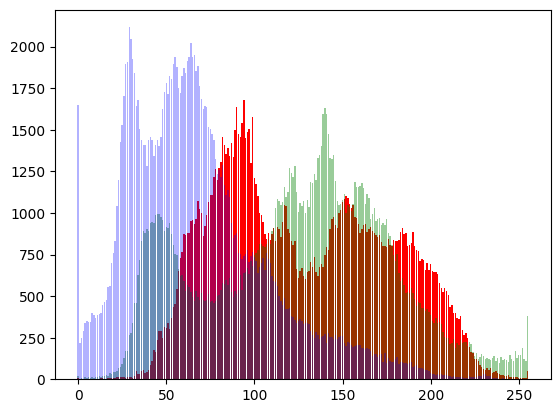

In [47]:
# Bir görüntünün RGB kanalları için piksel değerlerinin histogramlarını çizme
# Histogram() işlevi, her kanal için piksellerin histogramını (frekanslara karşı piksel değerleri tablosu) hesaplamak 
# ve birleştirilmiş çıktıyı döndürmek için kullanılabilir (örneğin, bir RGB görüntüsü için çıktı 3 x 256 = 768 değer içerir):

pl = im.histogram()
plt.bar(range(256), pl[:256], color='r', alpha=1)
plt.bar(range(256), pl[256:2*256], color='g', alpha=0.4)
plt.bar(range(256), pl[2*256:], color='b', alpha=0.3)
plt.show()

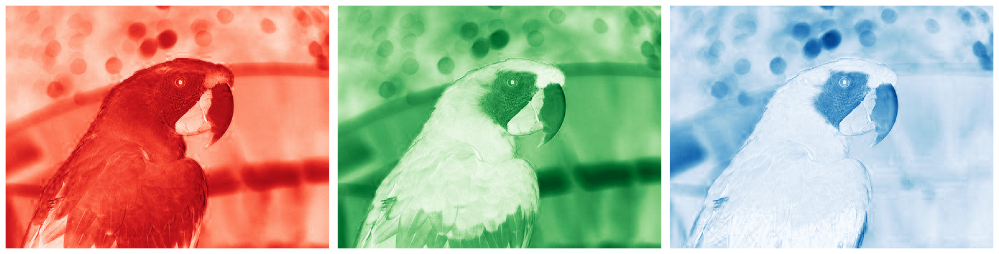

In [48]:
# Bir görüntünün RGB kanallarını ayırma
# Bir RGB görüntüsü için çok kanallı bir görüntünün kanallarını ayırmak amacıyla split() işlevini kullanabiliriz:

im = Image.open("Ims/parrot.png")
im.show()
ch_r, ch_g, ch_b = im.split() # RGB görüntüyü 3 kanala ayır: R, G ve B
# matplotlib kullanabiliriz:
plt.figure(figsize=(18,6))
plt.subplot(1,3,1); plt.imshow(ch_r, cmap=plt.cm.Reds); plt.axis('off')
plt.subplot(1,3,2); plt.imshow(ch_g, cmap=plt.cm.Greens); plt.axis('off')
plt.subplot(1,3,3); plt.imshow(ch_b, cmap=plt.cm.Blues); plt.axis('off')
plt.tight_layout()
plt.show() 

In [49]:
# Bir görüntünün birden fazla kanalını birleştirme

#Çok kanallı bir görüntünün kanallarını birleştirmek için merge() işlevini kullanabiliriz; 
# burada papağan RGB görüntüsü bölünerek elde edilen renk kanalları, kırmızı ve mavi kanallar değiştirildikten sonra birleştirilir:

im = Image.merge('RGB', (ch_b, ch_g, ch_r)) # red ve blue kanallar değiştiriliyor.
im.show()

In [50]:
# α-blending
# blend() işlevi, verilen iki görüntüyü (aynı boyutta) bir α sabiti kullanarak enterpole ederek yeni bir görüntü oluşturmak 
# için kullanılabilir. Her iki görüntü de aynı boyut ve moda sahip olmalıdır. 
# out = image1 * (1.0 - α) + image2 * α
#Eğer α 0.0 ise, ilk görüntünün bir kopyası α 1.0 ise ikinci görüntünün bir kopyası döndürülür.

im1 = Image.open("Ims/parrot.png")
im2 = Image.open("Ims/hill.png")
im1 = im1.convert('RGBA') # farklı moda sahip iki görüntü aynı moda dönüştürülmelidir.
im2 = im2.resize((im1.width, im1.height), Image.BILINEAR) # farklı boyuta sahip iki görüntü aynı boyuta dönüştürülmelidir.
im = Image.blend(im1, im2, alpha=0.5).show()



In [51]:
# İki görüntüyü üst üste bindirme
# İki girdi görüntüsü (aynı boyutta) piksel piksel çarpılarak bir görüntü diğerinin üzerine bindirilebilir. 

im1 = Image.open("Ims/parrot.png")
im2 = Image.open("Ims/hill.png").convert('RGB').resize((im1.width, im1.height))
multiply(im1, im2).show()


In [52]:
# İki görüntüyü ekleme
add(im1, im2).show()



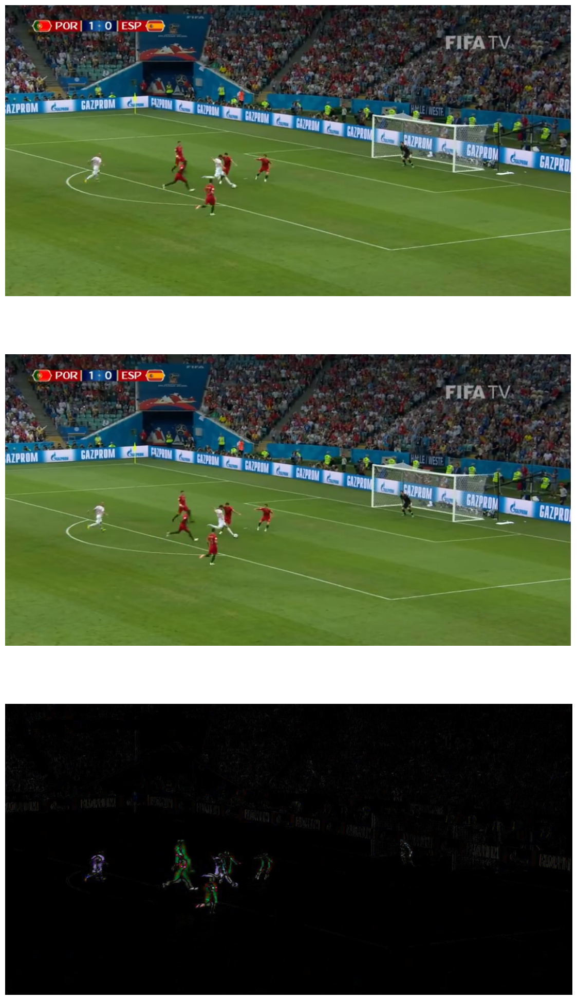

In [53]:
#İki görüntü arasındaki farkın hesaplanması

#Görüntü farkı, iki görüntü arasındaki değişiklikleri tespit etmek için kullanılabilir.

from PIL.ImageChops import subtract, multiply, screen, difference, add
im1 = Image.open("Ims/goal1.png") # Video dan iki ardışık frame al
im2 = Image.open("Ims/goal2.png")
im = difference(im1, im2)
plt.figure(figsize=(20,25))
im.save("Ims/goal_diff.png")
plt.subplot(311)
plt.imshow(im1)
plt.axis('off')
plt.subplot(312)
plt.imshow(im2)
plt.axis('off')
plt.subplot(313)
plt.imshow(im), plt.axis('off')
plt.show()




In [54]:
## Benzer şekilde iki görüntünün çıkarılması ve iki görüntü negatifinin üst üste bindirilmesi için 
# subtract() ve screen() fonksiyonlarından da faydalanılabilir.


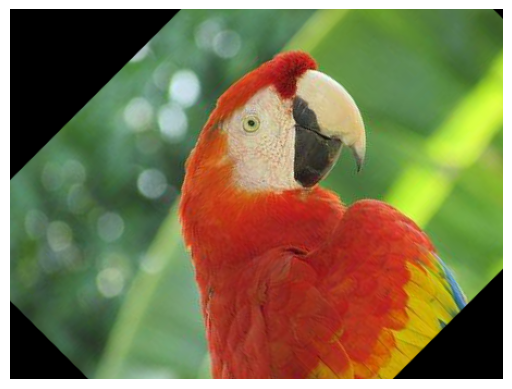

(<matplotlib.image.AxesImage at 0x29e9d876a50>,
 (np.float64(-0.5), np.float64(452.5), np.float64(339.5), np.float64(-0.5)),
 None)

In [55]:
# scikit-image ile görüntü manipülasyonu

#warp() fonksiyonunu kullanarak ters çarpıtma ve geometrik dönüştürme
  # Bir görüntüye Afin dönüşümü uygulama
      #Dönüşüm matrisini hesaplamak için SimilarityTransform() fonksiyonunu, ardından da dönüşümü gerçekleştirmek için 
      #warp() fonksiyonunu kullanabiliriz:
    
im = imread("Ims/parrot.png")
tform = SimilarityTransform(scale=0.9,rotation=np.pi/4,translation=(im.shape[0]/2, -100))
warped = warp(im, tform)
import matplotlib.pyplot as plt
plt.imshow(warped), plt.axis('off'), plt.show()

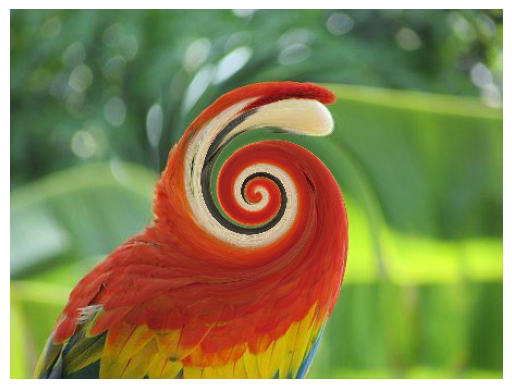

In [56]:
#Girdap (swirl) dönüşümünü uygulama
 #doğrusal olmayan bir dönüşümdür. 
 # strength, girdap miktarı, radius piksel cinsinden girdap kapsamını gösterir ve rotation bir dönüş açısı ekler.
im = imread("Ims/parrot.png")
swirled = swirl(im, rotation=0, strength=15, radius=200)
plt.imshow(swirled)
plt.axis('off')
plt.show()


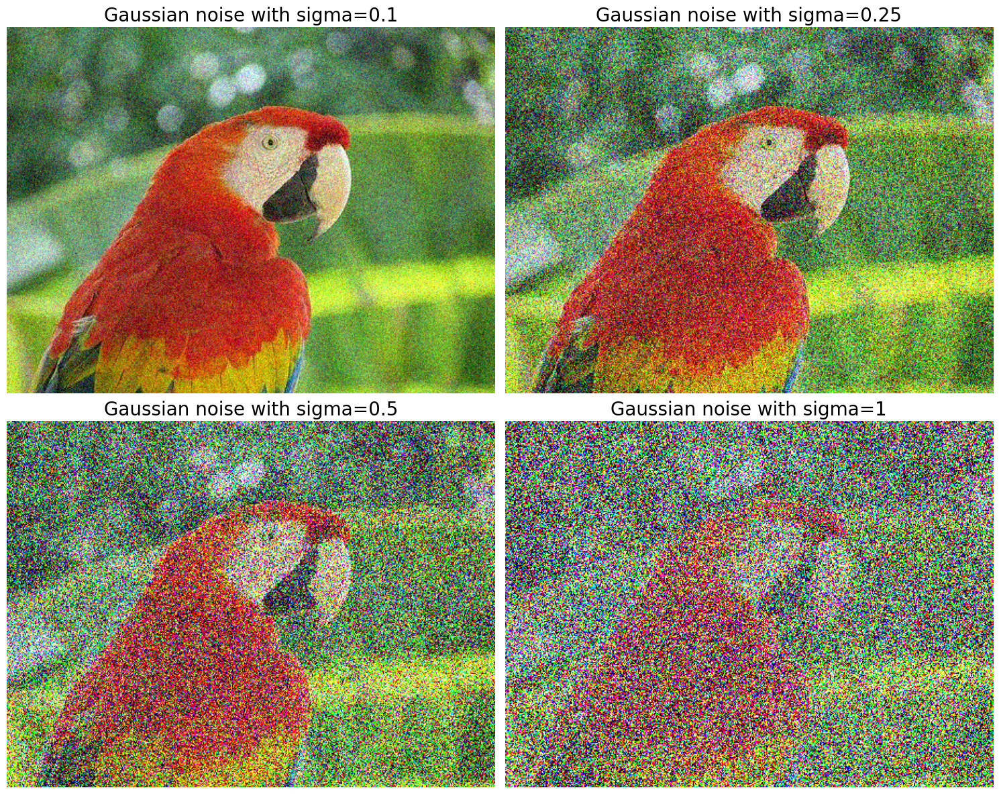

In [57]:
# Görüntülere rastgele Gauss gürültüsü ekleme
# https://hasty.ai/docs/mp-wiki/augmentations/gaussian-noise
# Bir görüntüye farklı gürültü türleri eklemek için random_noise() işlevini kullanabiliriz. 
# Farklı varyanslara sahip Gauss gürültüsünün bir görüntüye eklenmesi için:

im = img_as_float(imread("Ims/parrot.png"))
plt.figure(figsize=(15,12))
sigmas = [0.1, 0.25, 0.5, 1]
for i in range(4):
    noisy = random_noise(im, var=sigmas[i]**2)
    plt.subplot(2,2,i+1)
    plt.imshow(noisy)
    plt.axis('off')
    plt.title('Gaussian noise with sigma=' + str(sigmas[i]), size=20)
    plt.tight_layout()
plt.show()

#Standart sapma arttıkça çıktı görüntüsü daha gürültülü olmaktadır.

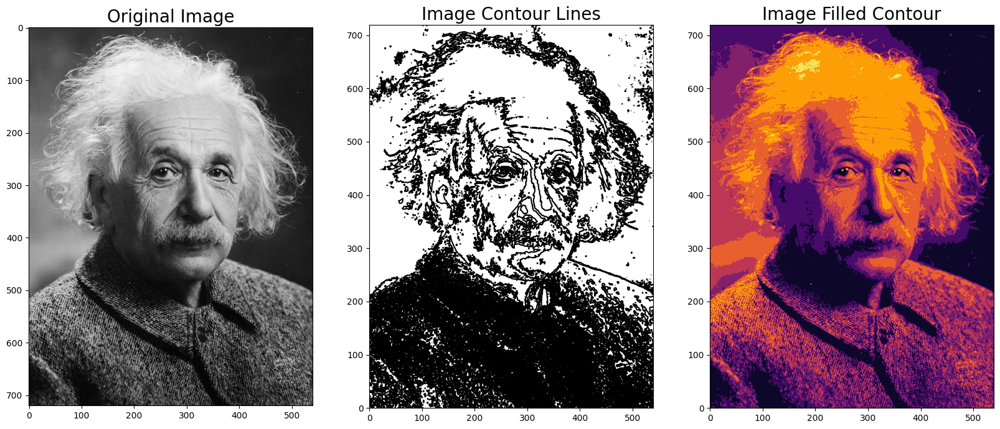

In [58]:
# Matplotlib ile görüntü manipülasyonu

# Görüntü için kontur çizgileri çizme
# Kontur çizgisi, aynı özel değere sahip tüm pikselleri birleştiren bir eğridir. 
# Konturlar basitçe, aynı renk veya yoğunluğa sahip tüm sürekli noktaları (sınır boyunca) birleştiren bir eğri olarak 
# açıklanabilir. Konturlar, şekil analizi ve nesne algılama ve tanıma için kullanışlı bir araçtır.

from skimage.color import rgb2gray
im = rgb2gray(imread("Ims/DALL·E11.png")) 
im = imread("Ims/einstein.jpg")
plt.figure(figsize=(20,8))
plt.subplot(131), plt.imshow(im, cmap='gray'), plt.title('Original Image', size=20)
plt.subplot(132), plt.contour(np.flipud(im), colors='k',
levels=np.logspace(-15, 15, 100))
plt.title('Image Contour Lines', size=20)
plt.subplot(133), plt.title('Image Filled Contour', size=20),
plt.contourf(np.flipud(im), cmap='inferno')
plt.show()
